In [ ]:
#default_exp explore_features

# Extract the image features

In [ ]:
#exporti
from fastcore.script import *
from fastai.vision.all import *
from fastai.callback.wandb import *
from self_supervised.augmentations import *
from self_supervised.layers import *
from self_supervised.vision.barlow_twins import *

# fixup depreciation
from kornia import augmentation as korniatfm
korniatfm.GaussianBlur = korniatfm.RandomGaussianBlur

In [ ]:
!ls ../women-in-tshirts-256/models

barlow-twins-resnet18-224-5e-proj2048-lr0.5e-3.pth
barlow-twins-resnet18-pretrained-224-5e-proj2048-lr0.5e-3.pth


In [ ]:
path = '../women-in-tshirts-256/'
model_file = '../women-in-tshirts-256/models/barlow-twins-resnet18-pretrained-224-5e-proj2048-lr0.5e-3.pth'
backbone:str    = 'resnet18' # backbone
pretrained:bool = True # pretrained
size:int        = 224 # size
projection_size = 2048 # projection_size

fastai_encoder = create_encoder('resnet18', pretrained=pretrained)
model = create_barlow_twins_model(fastai_encoder, projection_size=projection_size, hidden_size=projection_size)

dls = ImageDataLoaders.from_name_func(path, get_image_files(path), lambda x: False, item_tfms=Resize(size), valid_pct=0)
fnames = get_image_files(path)
test_dl = dls.test_dl(fnames)

load_model(model_file, model, None, with_opt=False)
model.train(False)

BarlowTwinsModel(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_st

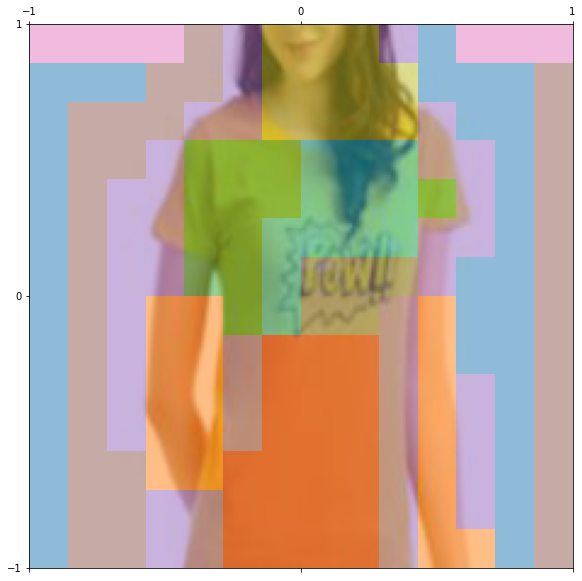

In [ ]:
from sklearn.cluster import KMeans
clusters = KMeans(10).fit_predict(features2dhr.view(256,-1).permute((1,0)).cpu().numpy())
_, ax = subplots(1,1, figsize=(10,10))
ax[0].imshow(dx.permute((0,2,3,1))[0], extent=(-1,1,-1,1))
ax[0].matshow(clusters.reshape(14,14), cmap=plt.get_cmap('tab10'), alpha=.5, extent=(-1,1,-1,1))

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

emb_50 = PCA(n_components=40).fit_transform(features2dhr.view(256,-1).permute((1,0)).cpu().numpy())
emb_2 = TSNE(n_components = 2, perplexity = 50, init='pca', learning_rate='auto').fit_transform(emb_50)

/Users/jpc/.conda/envs/ml-qa/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


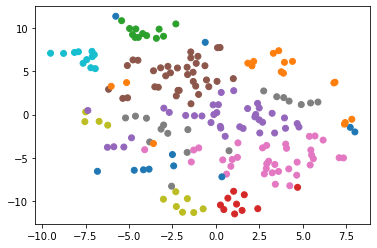

In [ ]:
plt.scatter(emb_2[:,0], emb_2[:,1], c=clusters, cmap=plt.get_cmap('tab10'))

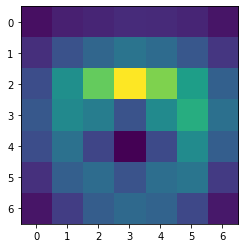

In [ ]:
plt.imshow(1-torch.linalg.norm(features2d.view(512,-1) - features2d[:,2,3][:,None], dim=0).view(7,7))

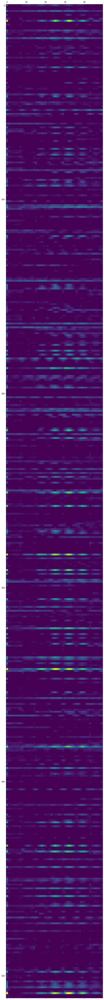

In [ ]:
_, ax = subplots(1,1, figsize=(10,100))
ax[0].matshow(torch.cat([features[:,None], features2d.view(512,-1)], dim=1))

In [ ]:
test_dl = dls.test_dl(fnames)

imgs = []
features2dhr = []
with torch.no_grad():
    for (dx,) in progress_bar(test_dl):
        imgs.append(dx)
        features2dhr.append(model.encoder[:-3](dx).detach())
imgs = torch.cat(imgs)
raw_features = torch.cat(features2dhr)
features2dhr = raw_features / torch.linalg.vector_norm(raw_features, dim=1, keepdims=True)

In [ ]:
features2dhr.shape

torch.Size([9087, 256, 14, 14])

In [ ]:
from sklearn.cluster import KMeans
clusters = KMeans(50).fit_predict(features2dhr.permute((0,2,3,1)).reshape(-1,256).cpu().numpy())

In [ ]:
clusters.shape

(19600,)

In [ ]:
np.unique(clusters, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
       dtype=int32),
 array([306, 107, 395, 539, 444, 362, 318, 598, 342, 430, 507, 527, 675,
        478, 324, 457, 393, 444, 373, 507, 396, 533, 396, 300, 421, 405,
        332, 345, 296, 466, 259, 341, 363, 301, 255, 405, 308, 313, 575,
        376, 359, 449, 458, 318, 303, 339, 518, 414, 204, 326]))

In [ ]:
clusters2d = clusters.reshape(100,14,14)

In [ ]:
np.unique(clusters2d[99], return_counts=True)

(array([ 1,  2,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 19,
        20, 21, 22, 24, 26, 27, 28, 29, 30, 33, 35, 36, 38, 41, 43, 44, 46,
        47, 48, 49], dtype=int32),
 array([ 1,  5,  1,  4,  6, 12,  5, 11,  9,  7,  5,  7,  1, 11,  2,  1,  1,
         2,  8,  6,  5,  4,  6,  1,  2,  1,  9,  2,  2,  5,  3,  1,  6,  3,
         1, 39,  1]))

In [ ]:
clusters1 = KMeans(20).fit_predict(features2dhr[99].permute((1,2,0)).reshape(-1,256).cpu().numpy())

In [ ]:
clusters1 = clusters1.reshape(14,14);
clusters1

array([[10, 10, 10, 10, 10, 16, 16, 16, 16, 16, 16, 10, 10, 10],
       [ 1,  9,  9,  9,  2, 18, 18, 18, 18,  5, 18,  1,  2, 13],
       [ 1,  9, 15, 15,  2,  2, 18, 18,  5,  5,  5,  2,  2, 13],
       [ 1,  9, 15, 15, 15,  2,  3, 18,  5,  5,  4,  4,  3,  3],
       [ 1,  9, 15, 15, 15,  3,  3,  4,  5,  4,  4,  4,  4, 11],
       [ 1,  9, 15, 15,  3, 12,  4,  4,  4,  7,  7,  7,  0, 11],
       [ 1,  9, 15,  3, 12,  4,  7,  7,  7,  7,  7,  7,  0, 11],
       [ 1,  9, 15, 12,  4,  0,  7,  7,  7,  7,  7,  7, 14, 11],
       [ 1,  9, 15, 12,  0,  0,  7,  7,  7,  7,  7,  7, 14, 11],
       [ 1,  9, 15, 12,  0,  0,  7,  7,  7,  7,  7,  7, 14, 13],
       [ 1,  9, 15, 19, 19,  0,  7,  7,  7,  7,  7,  7, 14, 13],
       [ 1,  9, 15, 19, 19, 19,  7,  7,  7,  7,  7,  7, 14, 13],
       [ 1,  9,  2,  2, 14, 14,  4,  7,  7,  7,  7,  7, 14, 13],
       [17, 17, 17, 17,  8,  8,  6,  6,  6,  6,  6,  6,  8,  8]],
      dtype=int32)

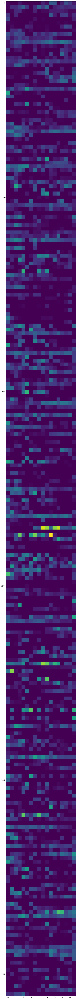

In [ ]:
_, ax = subplots(1,1, figsize=(15,100))
ax[0].imshow(torch.hstack([raw_features[99].permute((1,2,0))[torch.tensor(clusters1 == 0)].T, raw_features[99].permute((1,2,0))[torch.tensor(clusters1 == 12)].T]))

In [ ]:
face_feat = raw_features[99].permute((1,2,0))[torch.tensor(clusters1 == 3)].mean(dim=0)
min_dist = torch.linalg.norm(raw_features.permute((0,2,3,1)) - face_feat, dim=3).min(dim=1).values.min(dim=1).values
similar = min_dist.argsort()

In [ ]:
def plot_dist_hist(i, features=raw_features, range=(0,2), ax=plt, norm=False):
    face_feat = features[99].permute((1,2,0))[torch.tensor(clusters1 == i)].mean(dim=0)
    min_dist = torch.linalg.norm(features.permute((0,2,3,1)) - face_feat, dim=3).min(dim=1).values.min(dim=1).values
    if norm:
        min_dist -= min_dist.mean()
        min_dist /= min_dist.std()
    similar = min_dist.argsort()
    ax.set_title(f"{i}     {min_dist.mean():.2f}")
    ax.hist(min_dist.numpy(), bins=10, alpha=.7, range=range)

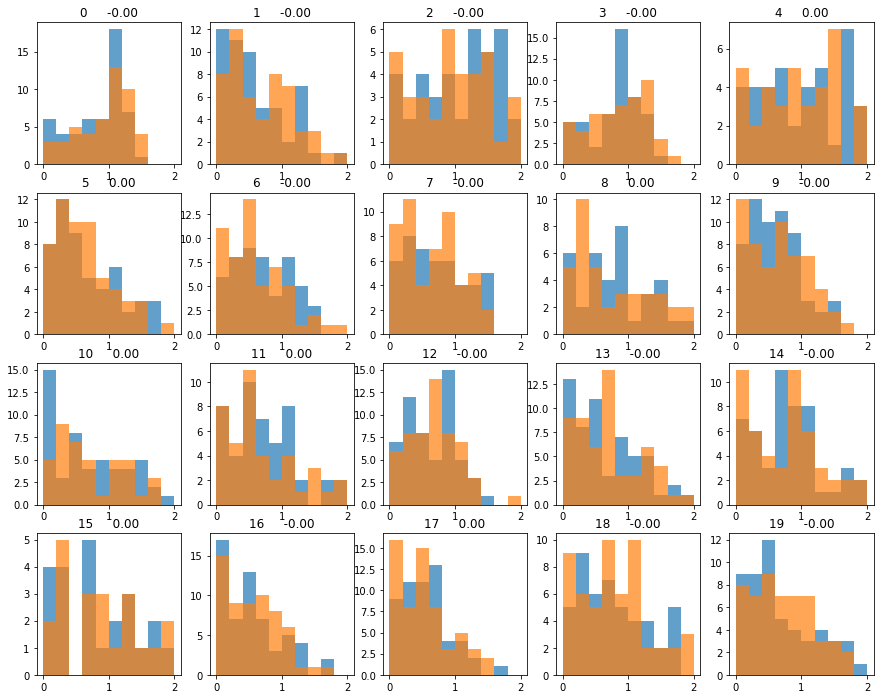

In [ ]:
_, axs = subplots(4,5)
for i, ax in zip(range(20), axs.reshape(-1)):
    plot_dist_hist(i, ax=ax, norm=True)
    plot_dist_hist(i, features=features2dhr, ax=ax, norm=True)

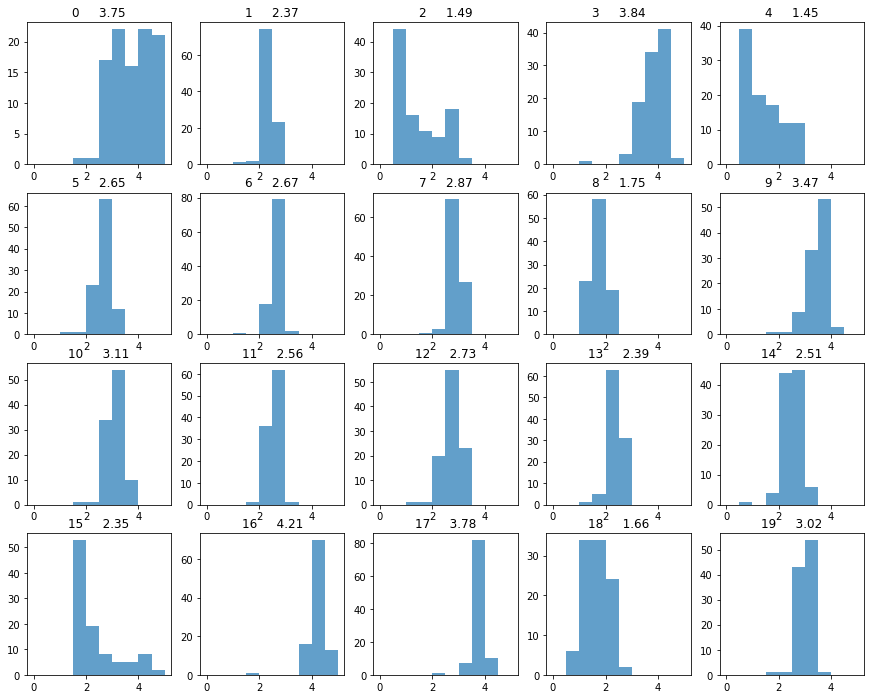

In [ ]:
_, axs = subplots(4,5)
for i, ax in zip(range(20), axs.reshape(-1)):
    plot_dist_hist(i, features=raw_features, range=(0,5), ax=ax)

2 TensorImage(1.4919)


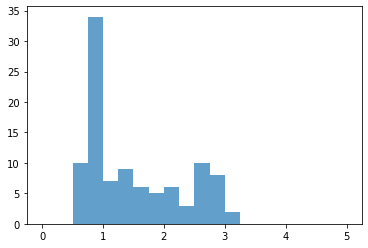

In [ ]:
plot_dist_hist(2)

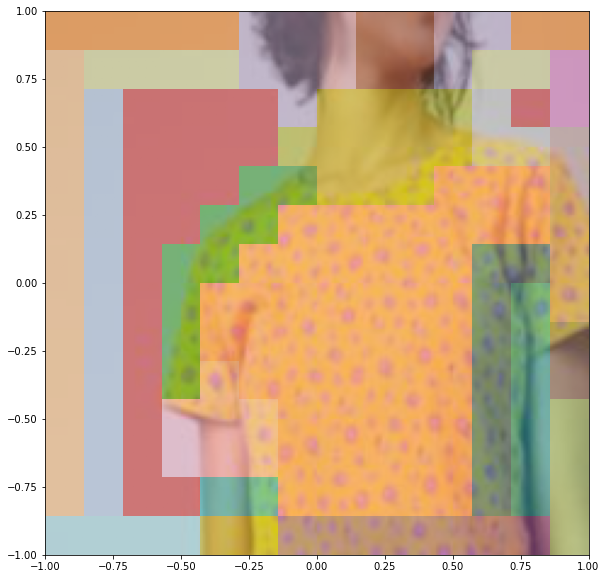

In [ ]:
_, ax = subplots(1,1, figsize=(10,10))
ax[0].imshow(imgs[99].permute((1,2,0)), extent=(-1,1,-1,1))
ax[0].imshow(clusters1.reshape(14,14), alpha=.5, extent=(-1,1,-1,1), cmap=plt.get_cmap('tab20'))
#ax[0].imshow(torch.linalg.norm(features2dhr[99].view(256,-1), dim=0).view(14,14), alpha=.5, extent=(-1,1,-1,1))

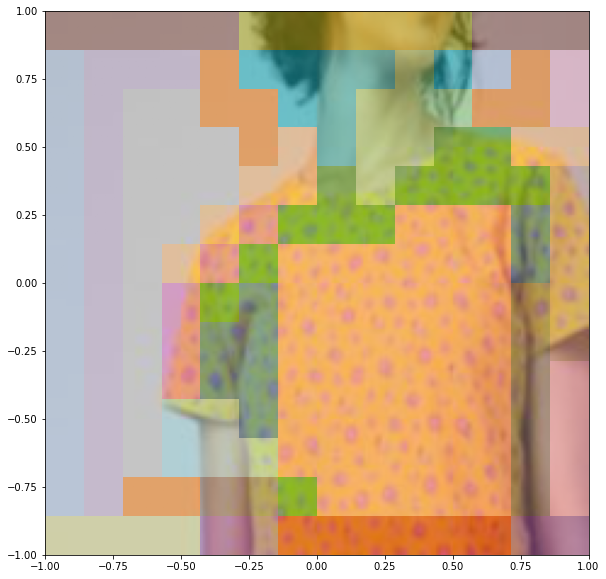

In [ ]:
_, ax = subplots(1,1, figsize=(10,10))
ax[0].imshow(imgs[99].permute((1,2,0)), extent=(-1,1,-1,1))
ax[0].imshow(clusters1.reshape(14,14), alpha=.5, extent=(-1,1,-1,1), cmap=plt.get_cmap('tab20'))
#ax[0].imshow(torch.linalg.norm(features2dhr[99].view(256,-1), dim=0).view(14,14), alpha=.5, extent=(-1,1,-1,1))

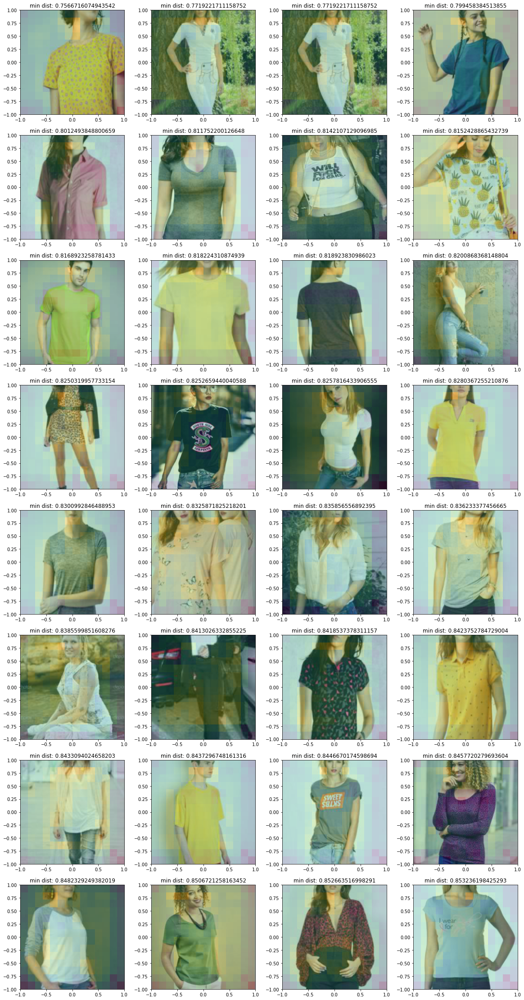

In [ ]:
features = raw_features
face_feat = features[99].permute((1,2,0))[torch.tensor(clusters1 == 18)].mean(dim=0)
min_dist = torch.linalg.norm(features.permute((0,2,3,1)) - face_feat, dim=3).min(dim=1).values.min(dim=1).values
similar = min_dist.argsort()

_, axs = subplots(8,4, figsize=(20,40))
for k,ax in zip(similar, axs.reshape(-1)):
    ax.imshow(imgs[k].permute((1,2,0)), extent=(-1,1,-1,1))
    diff = torch.linalg.norm(raw_features[k].permute((1,2,0)) - face_feat, dim=2)
    ax.set_title(f"min dist: {diff.min()}")
    ax.imshow(-diff, alpha=.3, extent=(-1,1,-1,1), interpolation='none')

In [ ]:
similar[6]

TensorImage(1701)

In [ ]:
features2dhr.size()

torch.Size([9087, 256, 14, 14])

TensorImage([ 301, 8007, 2291,  ...,  850, 7912, 8250])


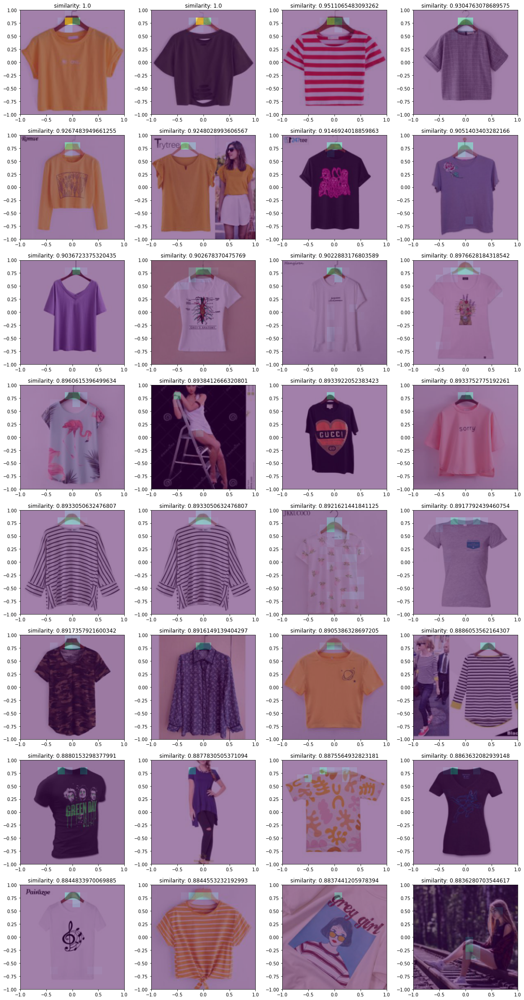

In [ ]:
features = features2dhr
# face_feat = features[99].permute((1,2,0))[torch.tensor(clusters1 == 18)].max(dim=0).values
face_feat = torch.maximum(
    features[301].permute((1,2,0))[1,6],
    features[8007].permute((1,2,0))[1,6],
)
min_dist = -torch.linalg.norm(torch.minimum(features.permute((0,2,3,1)), face_feat), dim=3).max(dim=1).values.max(dim=1).values
similar = min_dist.argsort()
print(similar)

_, axs = subplots(8,4, figsize=(20,40))
for k,ax in zip(similar, axs.reshape(-1)):
    ax.imshow(imgs[k].permute((1,2,0)), extent=(-1,1,-1,1))
#     diff = torch.linalg.norm(raw_features[k].permute((1,2,0)) - face_feat, dim=2)
    diff = torch.linalg.norm(torch.minimum(features[k].permute((1,2,0)), face_feat), dim=2)
    ax.set_title(f"similarity: {diff.max()}")
    ax.imshow(diff, alpha=.5, extent=(-1,1,-1,1), interpolation='none', vmin=0.8, vmax=1)

TensorImage([  99,  843,  301,  ..., 5369, 1184, 8250])


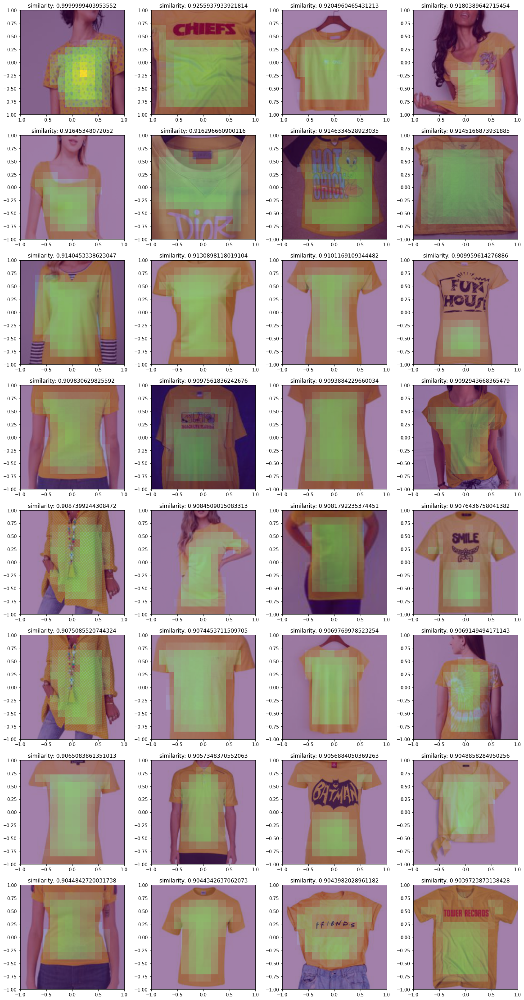

In [ ]:
features = features2dhr
# face_feat = features[99].permute((1,2,0))[torch.tensor(clusters1 == 18)].max(dim=0).values
face_feat = features[99].permute((1,2,0))[8,8]
min_dist = -torch.linalg.norm(torch.minimum(features.permute((0,2,3,1)), face_feat), dim=3).max(dim=1).values.max(dim=1).values
similar = min_dist.argsort()
print(similar)

_, axs = subplots(8,4, figsize=(20,40))
for k,ax in zip(similar, axs.reshape(-1)):
    ax.imshow(imgs[k].permute((1,2,0)), extent=(-1,1,-1,1))
#     diff = torch.linalg.norm(raw_features[k].permute((1,2,0)) - face_feat, dim=2)
    diff = torch.linalg.norm(torch.minimum(features[k].permute((1,2,0)), face_feat), dim=2)
    ax.set_title(f"similarity: {diff.max()}")
    ax.imshow(diff, alpha=.5, extent=(-1,1,-1,1), interpolation='none', vmin=0.8, vmax=1)

TensorImage([  99,  843,  301,  ..., 1868, 5564, 8250])


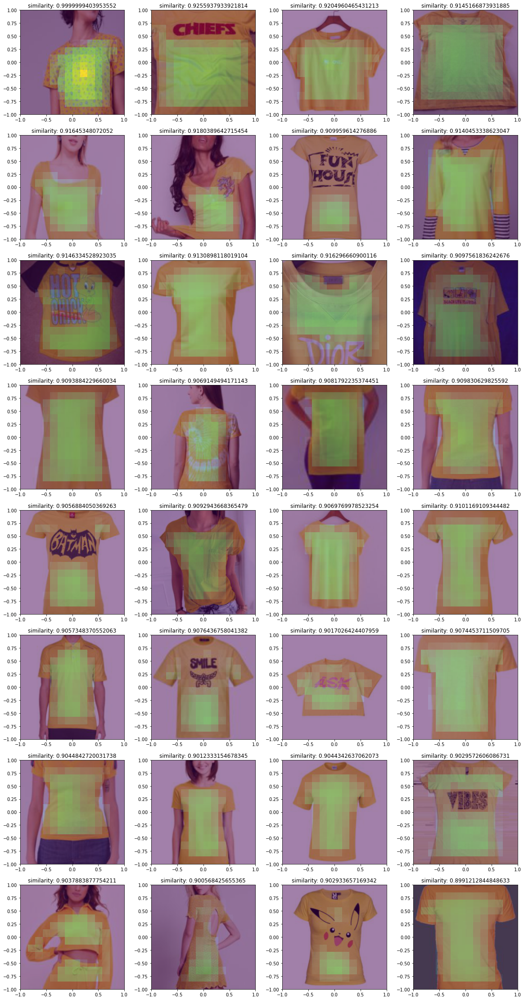

In [ ]:
features = features2dhr
# face_feat = features[99].permute((1,2,0))[torch.tensor(clusters1 == 18)].max(dim=0).values
face_feat = features[99].permute((1,2,0))[8,8]
min_dist = -torch.sum(features.permute((0,2,3,1)) * face_feat, dim=3).max(dim=1).values.max(dim=1).values
similar = min_dist.argsort()
print(similar)

_, axs = subplots(8,4, figsize=(20,40))
for k,ax in zip(similar, axs.reshape(-1)):
    ax.imshow(imgs[k].permute((1,2,0)), extent=(-1,1,-1,1))
#     diff = torch.linalg.norm(raw_features[k].permute((1,2,0)) - face_feat, dim=2)
    diff = torch.linalg.norm(torch.minimum(features[k].permute((1,2,0)), face_feat), dim=2)
    ax.set_title(f"similarity: {diff.max()}")
    ax.imshow(diff, alpha=.5, extent=(-1,1,-1,1), interpolation='none', vmin=0.8, vmax=1)

TensorImage([ 301, 2291, 8007,  ..., 5564, 7313, 8250])


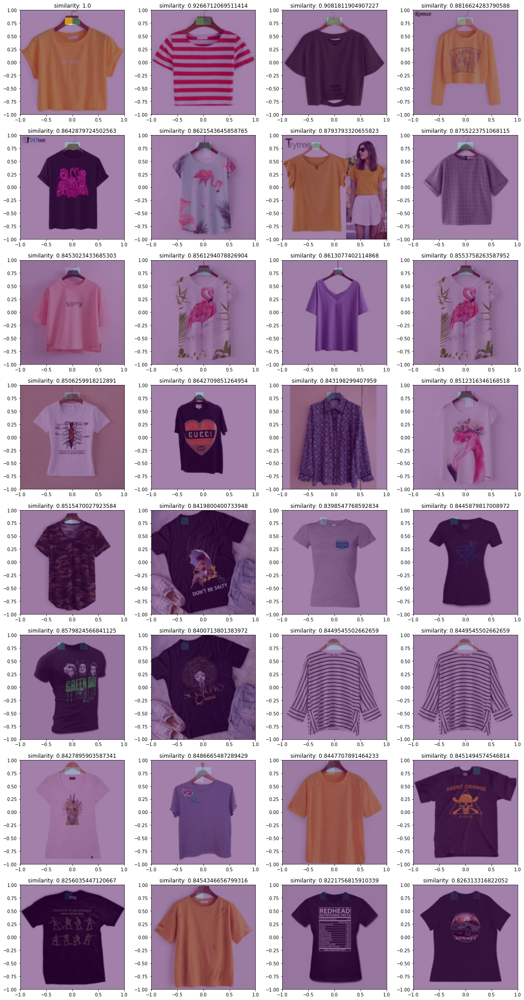

In [ ]:
features = features2dhr
# face_feat = features[99].permute((1,2,0))[torch.tensor(clusters1 == 18)].max(dim=0).values
face_feat = features[301].permute((1,2,0))[1,6]
min_dist = torch.linalg.norm(features.permute((0,2,3,1)) - face_feat, dim=3).min(dim=1).values.min(dim=1).values
similar = min_dist.argsort()
print(similar)

_, axs = subplots(8,4, figsize=(20,40))
for k,ax in zip(similar, axs.reshape(-1)):
    ax.imshow(imgs[k].permute((1,2,0)), extent=(-1,1,-1,1))
#     diff = torch.linalg.norm(raw_features[k].permute((1,2,0)) - face_feat, dim=2)
    diff = torch.linalg.norm(torch.minimum(features[k].permute((1,2,0)), face_feat), dim=2)
    ax.set_title(f"similarity: {diff.max()}")
    ax.imshow(diff, alpha=.5, extent=(-1,1,-1,1), interpolation='none', vmin=0.8, vmax=1)

In [ ]:
all_dists = [
    *all_metrics(slice(0,-1), img_features_norm, needle_norm),
    *all_metrics(slice(0,-1), img_features_norm, needle_norm_mean),
]

In [ ]:
all_dists[5][2].mean(), all_dists[5][2].std()

(TensorImage(0.1164), TensorImage(0.1649))

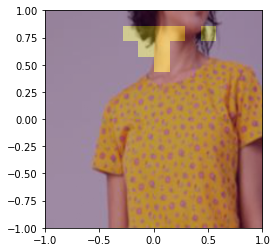

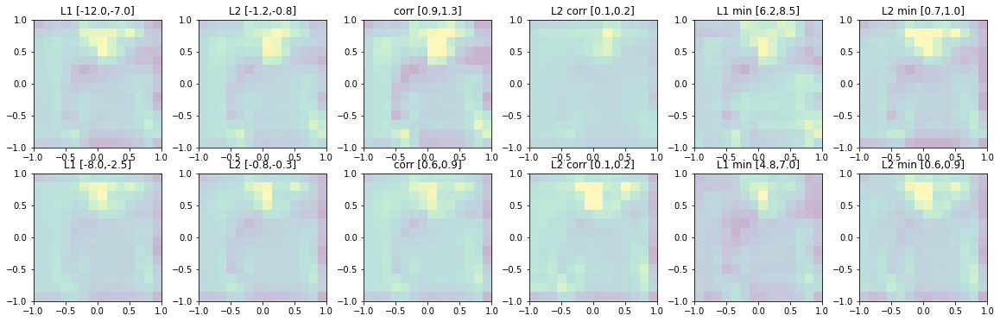

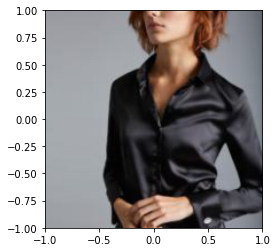

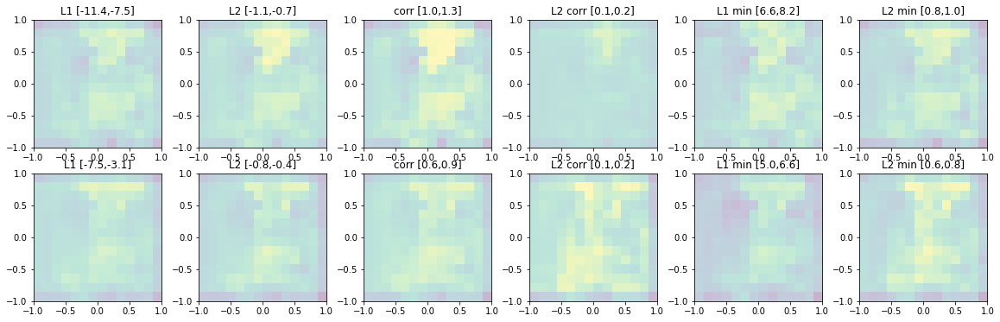

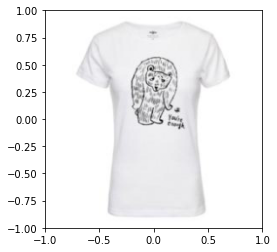

...

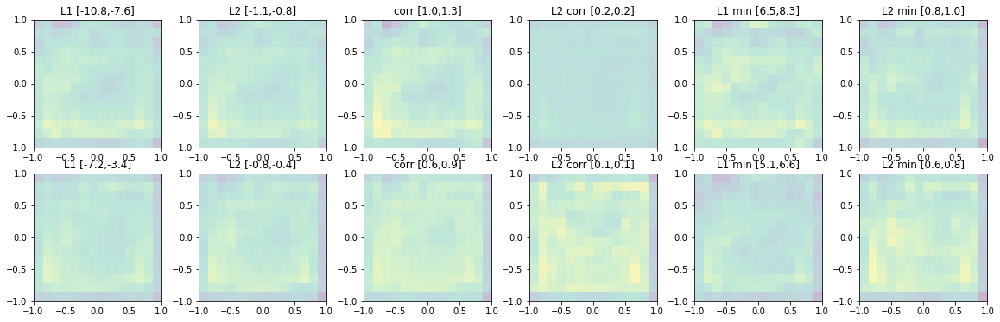

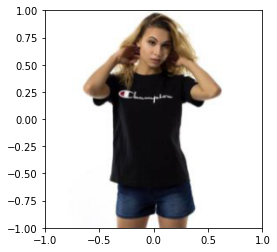

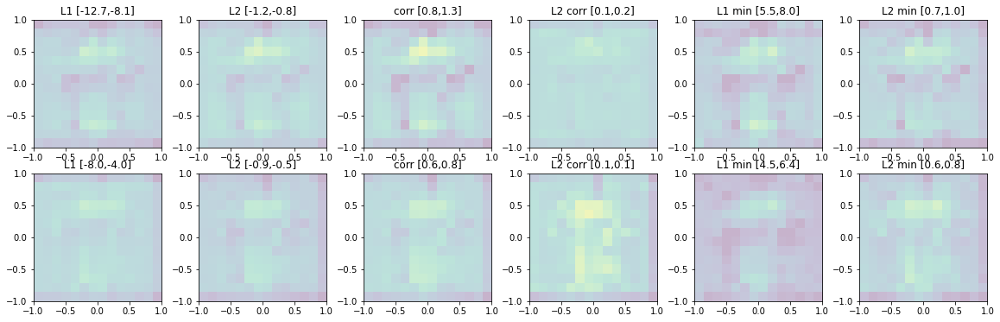

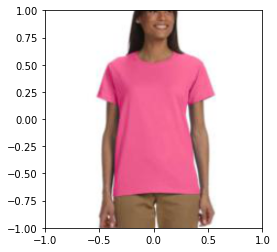

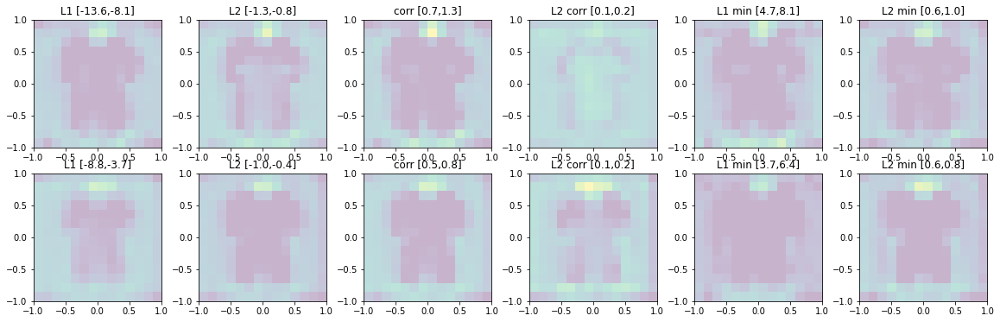

In [ ]:
features = raw_features
clid = 18
k=99
img_features = raw_features.permute((0,2,3,1))# - raw_features.mean()
img_features_norm = features2dhr.permute((0,2,3,1))# - raw_features.mean()
needle = img_features[k][torch.tensor(clusters1 == clid)].max(dim=0).values
needle_mean = img_features[k][torch.tensor(clusters1 == clid)].mean(dim=0)
needle_norm = img_features_norm[k][torch.tensor(clusters1 == clid)].max(dim=0).values
needle_norm_mean = img_features_norm[k][torch.tensor(clusters1 == clid)].mean(dim=0)

def L1_dist(x,y):
    return (x - y).abs().sum(dim=2)

def L2_dist(x,y):
    return torch.linalg.norm(x - y, dim=2)

def all_metrics(k, features, needle, needle2):
    return [
        ("L1", k, -L1_dist(features[k], needle), -11.5, -7),
        ("L2", k, -L2_dist(features[k], needle), -1.2, -.75),
        ("corr", k, torch.sum(features[k] * needle, dim=2), 1, 1.3),
        ("L2 corr", k, torch.linalg.norm(features[k] * needle, dim=2), .1, .25),
        ("L1 min", k, torch.sum(torch.minimum(features[k], needle), dim=2), 6.2, 8.5),
        ("L2 min", k, torch.linalg.norm(torch.minimum(features[k], needle), dim=2), 0.8, 1),
    ] + [
        ("L1", k, -L1_dist(features[k], needle2), -8, -2.5),
        ("L2", k, -L2_dist(features[k], needle2), -0.8, -.3),
        ("corr", k, torch.sum(features[k] * needle2, dim=2), 0.6, 0.9),
        ("L2 corr", k, torch.linalg.norm(features[k] * needle2, dim=2), .1, .15),
        ("L1 min", k, torch.sum(torch.minimum(features[k], needle2), dim=2), 5, 7),
        ("L2 min", k, torch.linalg.norm(torch.minimum(features[k], needle2), dim=2), 0.65, 0.85),
    ]

def plot_metrics(k, clusters=None):
    plt.figure()
    plt.imshow(imgs[k].permute((1,2,0)), extent=(-1,1,-1,1))
    if clusters is not None: plt.imshow(clusters, extent=(-1,1,-1,1), alpha=.3)
    dists = [
        *all_metrics(k, img_features_norm, needle_norm, needle_norm_mean),
#         *all_metrics(k, img_features_norm, needle_norm_mean),
    ]
    _, axs = subplots(2,6, figsize=(20,6))
    for i,(name, k, dist, vmin, vmax),ax in zip(range(100), dists, axs.reshape(-1)):
        ax.set_title(f"{name} [{dist.min():.1f},{dist.max():.1f}]")
        ax.imshow(dist, alpha=.3, extent=(-1,1,-1,1), interpolation='none', vmin=vmin, vmax=vmax)
#         dmean=all_dists[i][2].mean()
#         dstd=all_dists[i][2].std()
#         ax.imshow(dist, alpha=.3, extent=(-1,1,-1,1), interpolation='none',
#                   vmin=dmean-6*dstd, vmax=dmean+6*dstd)

dists = [
#     *all_metrics(img_features, needle),
#     *all_metrics(img_features - raw_features.mean(), needle - raw_features.mean()),
#     *all_metrics(img_features_norm, needle_norm),
#     *all_metrics(img_features_norm, needle_norm_mean),
#     ("src cluster", k, clusters1 == clid),
#     ("mean dist", 1701, -torch.mean(raw_features[1701].permute((1,2,0)) - face_feat, dim=2)),
#     ("l2 dist", 1701, -torch.linalg.norm(raw_features[1701].permute((1,2,0)) - face_feat, dim=2)),
#     ("mean corr", 1701, torch.mean(raw_features[1701].permute((1,2,0)) * face_feat, dim=2)),
#     ("l2 corr", 1701, torch.linalg.norm(raw_features[1701].permute((1,2,0)) * face_feat, dim=2)),
]

plot_metrics(k, clusters = clusters1 == clid)
plot_metrics(1701)
plot_metrics(4567)
plot_metrics(1235)
plot_metrics(1236)
plot_metrics(1700)
plot_metrics(1500)

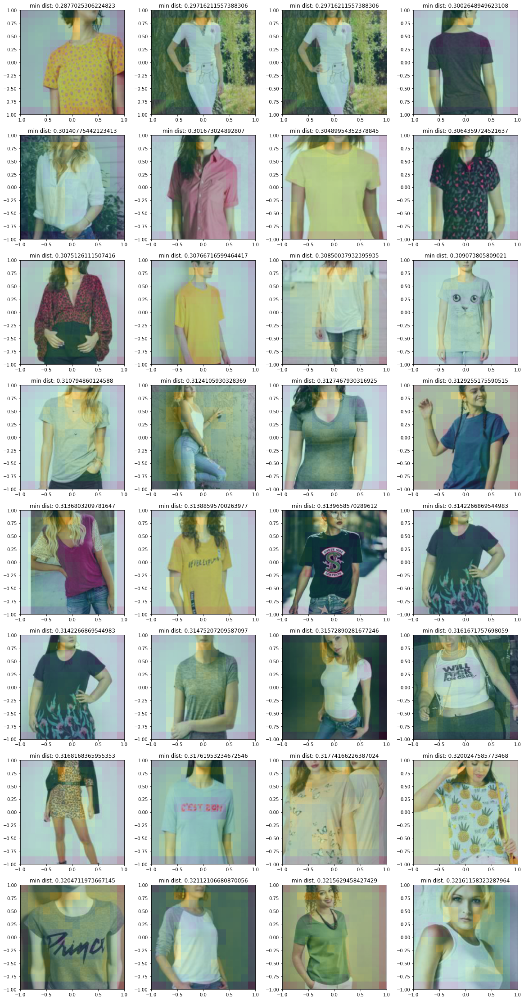

In [ ]:
features = features2dhr
face_feat = features[99].permute((1,2,0))[torch.tensor(clusters1 == 18)].mean(dim=0)
min_dist = torch.linalg.norm(features.permute((0,2,3,1)) - face_feat, dim=3).min(dim=1).values.min(dim=1).values
similar = min_dist.argsort()

_, axs = subplots(8,4, figsize=(20,40))
for k,ax in zip(similar, axs.reshape(-1)):
    ax.imshow(imgs[k].permute((1,2,0)), extent=(-1,1,-1,1))
    diff = torch.linalg.norm(features[k].permute((1,2,0)) - face_feat, dim=2)
    ax.set_title(f"min dist: {diff.min()}")
    ax.imshow(-diff, alpha=.3, extent=(-1,1,-1,1), interpolation='none')

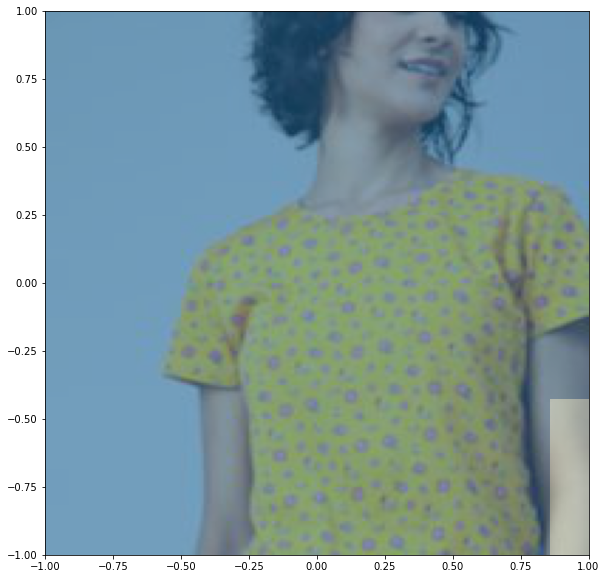

In [ ]:
k = 99
_, ax = subplots(1,1, figsize=(10,10))
ax[0].imshow(PILImage.create(fnames[k]), extent=(-1,1,-1,1))
ax[0].imshow(clusters1 == 3, alpha=.5, extent=(-1,1,-1,1), cmap=plt.get_cmap('tab20'))
#ax[0].imshow(torch.linalg.norm(features2dhr[99].view(256,-1), dim=0).view(14,14), alpha=.5, extent=(-1,1,-1,1))